Generating plot from tsv file:  1De_h62-9g_1.tsv
Generating plot from tsv file:  1De_h62-9g_2.tsv
Generating plot from tsv file:  1De_h62-9g_3.tsv
Generating plot from tsv file:  1De_h62-9g_4.tsv
Generating plot from tsv file:  1De_v24-0g_h62-9g_1.tsv
Generating plot from tsv file:  1De_v24-0g_h62-9g_2.tsv
Generating plot from tsv file:  1De_v60-7g_h62-9g_1.tsv
Generating plot from tsv file:  1De_v60-7g_h62-9g_2.tsv
Generating plot from tsv file:  1Drm_h23-3g_1.tsv
Generating plot from tsv file:  1Drm_h23-3g_2.tsv
Generating plot from tsv file:  1Drm_h23-3g_3.tsv
Generating plot from tsv file:  1Drm_h23-3g_4.tsv
Generating plot from tsv file:  1Drm_h23-3g_5.tsv
Generating plot from tsv file:  1Drm_h23-3g_6.tsv
Generating plot from tsv file:  1Drm_v23-1g_h23-3g_1.tsv
Generating plot from tsv file:  1Drm_v23-1g_h23-3g_10.tsv
Generating plot from tsv file:  1Drm_v23-1g_h23-3g_11.tsv
Generating plot from tsv file:  1Drm_v23-1g_h23-3g_2.tsv
Generating plot from tsv file:  1Drm_v23-1g_h23-3g

C:\Users\Kalle\AppData\Local\Temp\ipykernel_2160\2630076482.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(dpi=180)


Generating plot from tsv file:  1Drm_v23-1g_h23-3g_7.tsv
Generating plot from tsv file:  1Drm_v23-1g_h23-3g_8.tsv
Generating plot from tsv file:  1Drm_v23-1g_h23-3g_9.tsv
Generating plot from tsv file:  1Drm_v31-4g_h23-3g_1.tsv
Generating plot from tsv file:  1Drm_v60_9g_h23-3g_1.tsv
Generating plot from tsv file:  1Drm_v60_9g_h31-4g_1.tsv
Generating plot from tsv file:  1Drm_v75_7g_h23-3g_1.tsv
Generating plot from tsv file:  1Drm_v75_7g_h31-4g_1.tsv
Generating plot from tsv file:  1Drm_v75_7g_h60-9g_1.tsv
Generating plot from tsv file:  1De_h62-1g_1.tsv
Generating plot from tsv file:  1De_h62-1g_2.tsv
Generating plot from tsv file:  1De_h62-1g_3.tsv
Generating plot from tsv file:  1De_v23-1g_h62-1g_1.tsv
Generating plot from tsv file:  1De_v23-1g_h62-1g_2.tsv
Generating plot from tsv file:  1De_v23-1g_h62-1g_3.tsv
Generating plot from tsv file:  1De_v23-1g_h62-1g_4.tsv
Generating plot from tsv file:  1De_v31-4g_h62-1g_1.tsv
Generating plot from tsv file:  1De_v31-4g_h62-1g_2.tsv
Gene

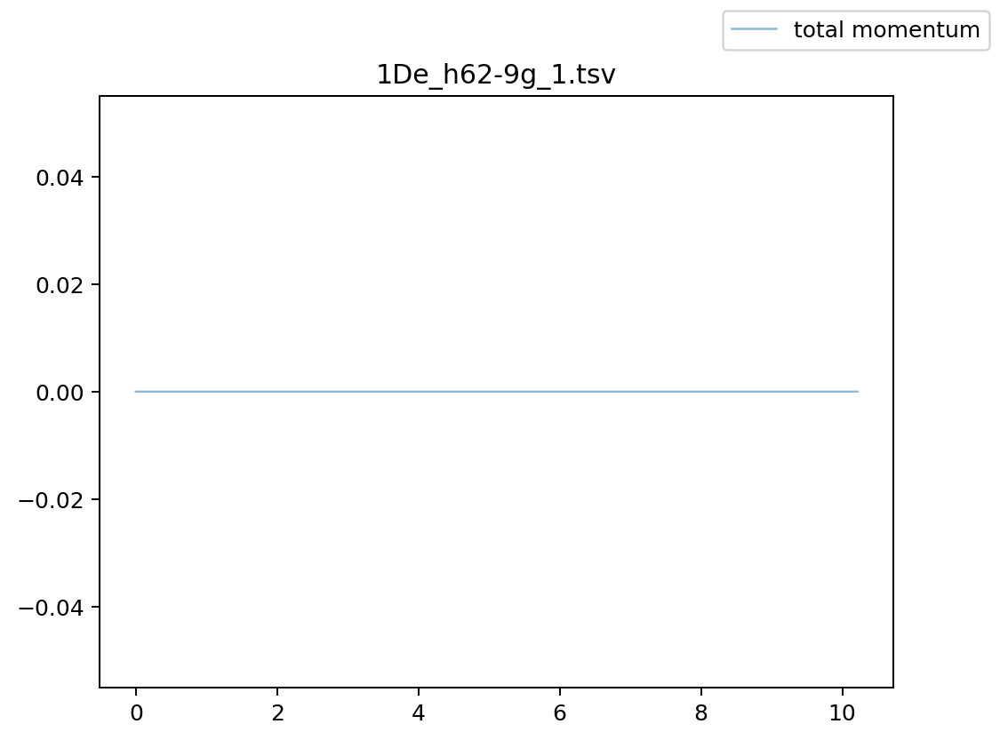

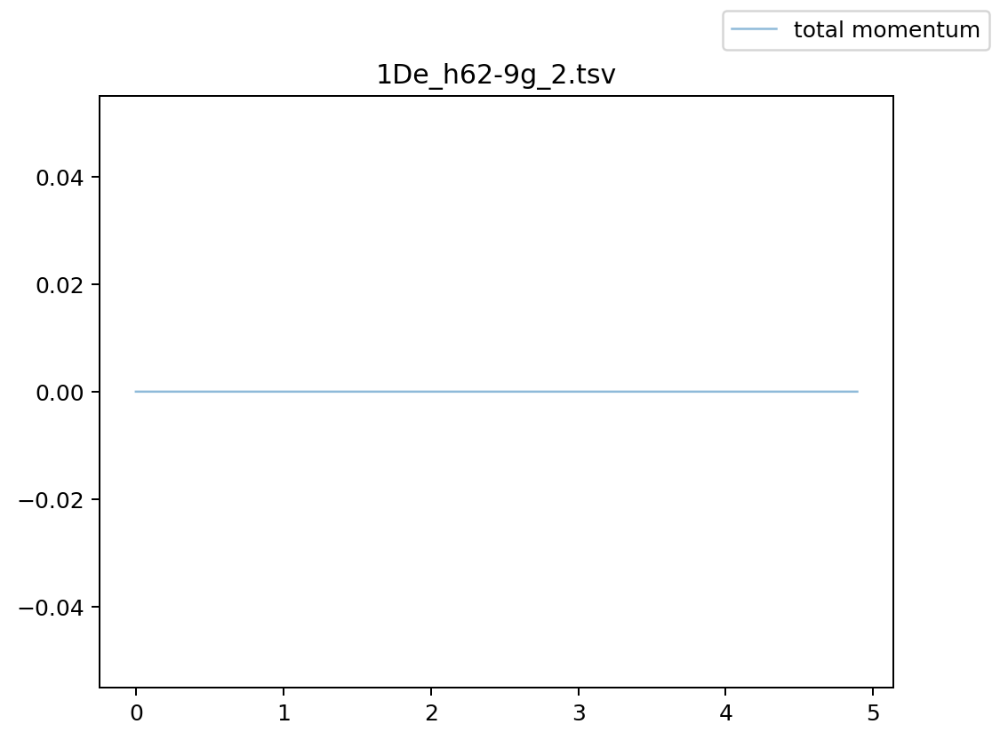

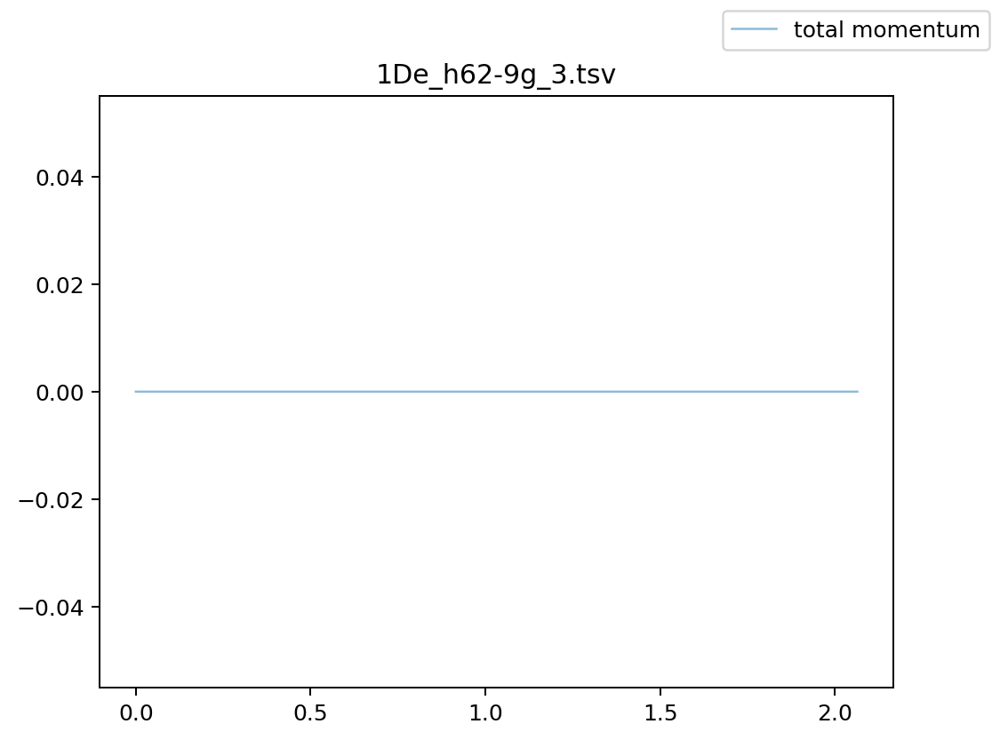

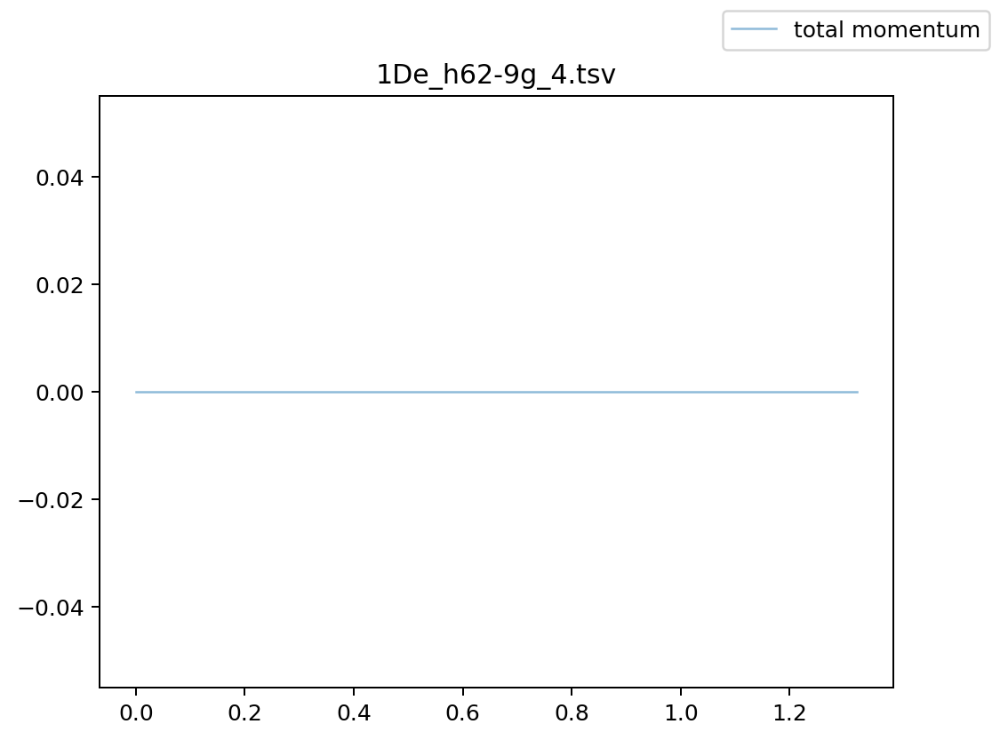

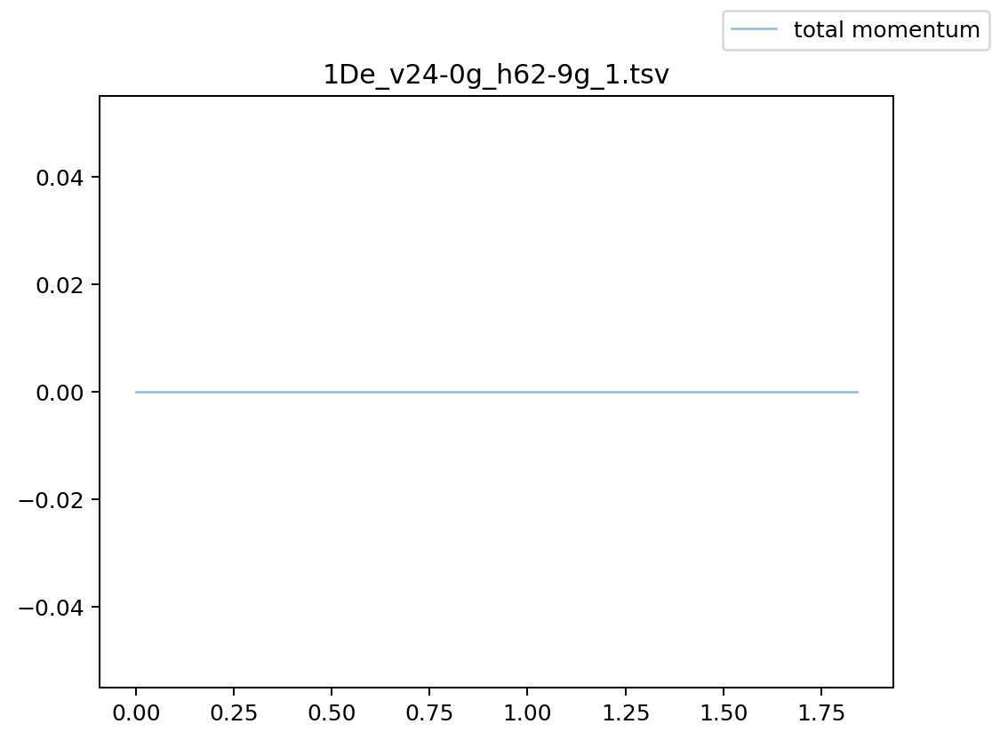

...

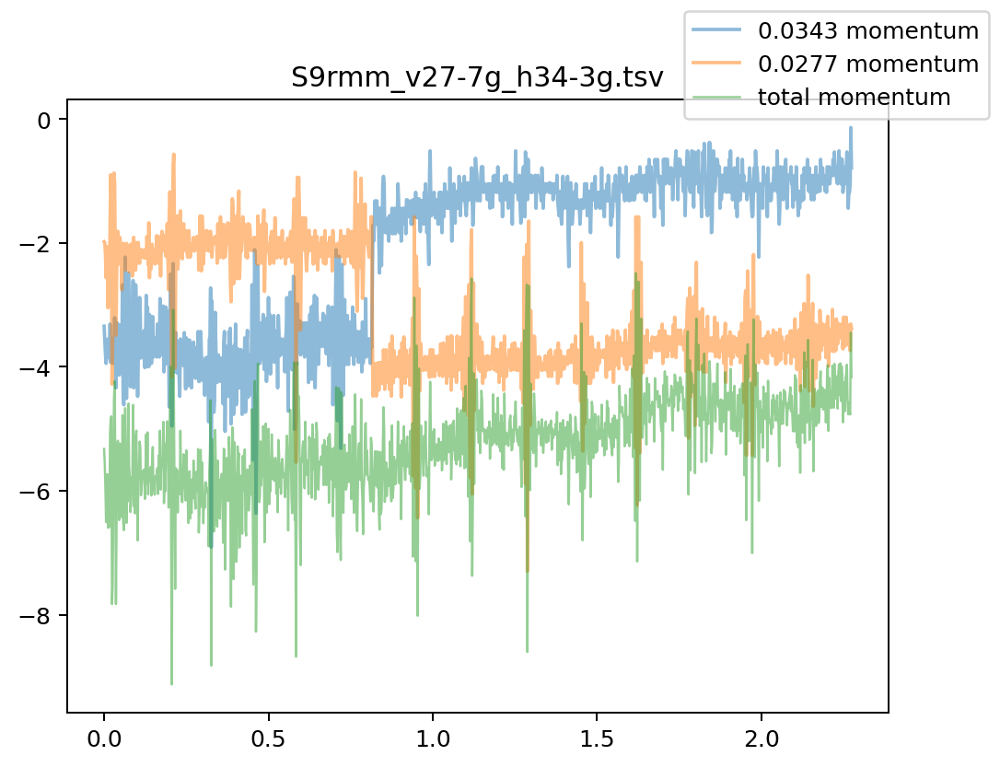

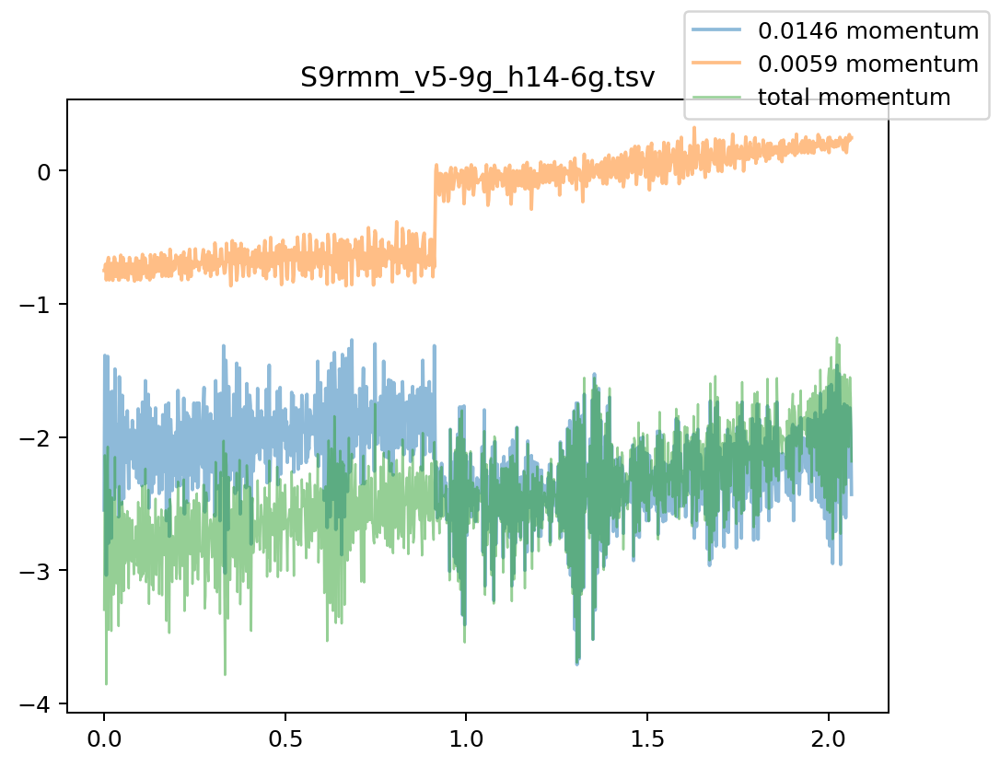

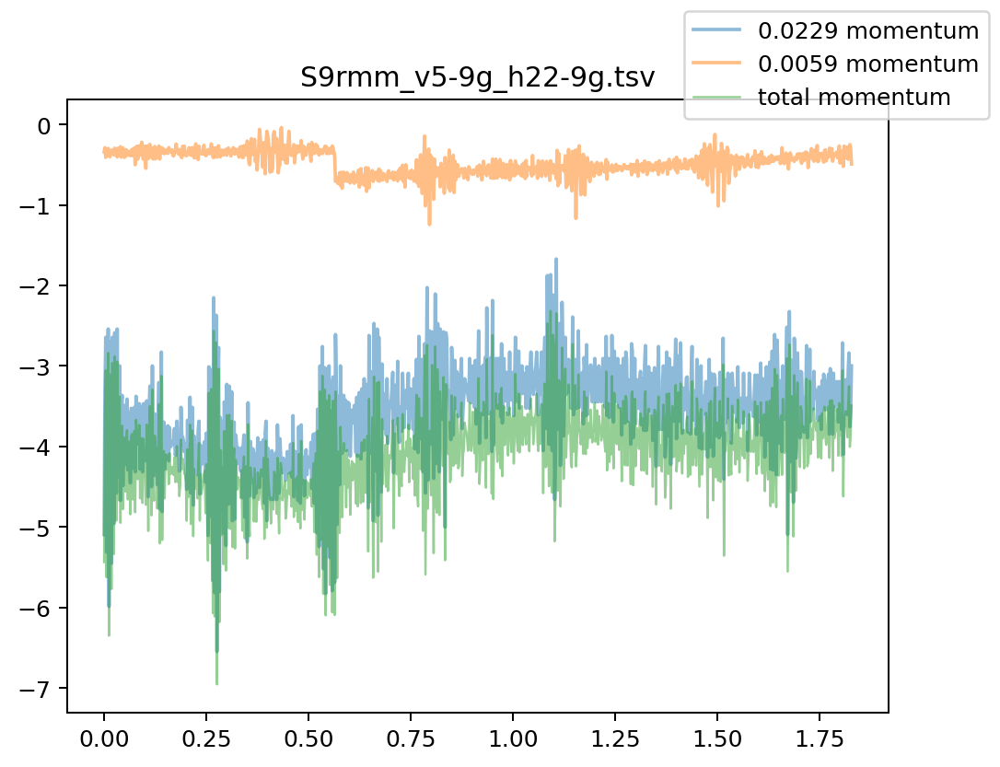

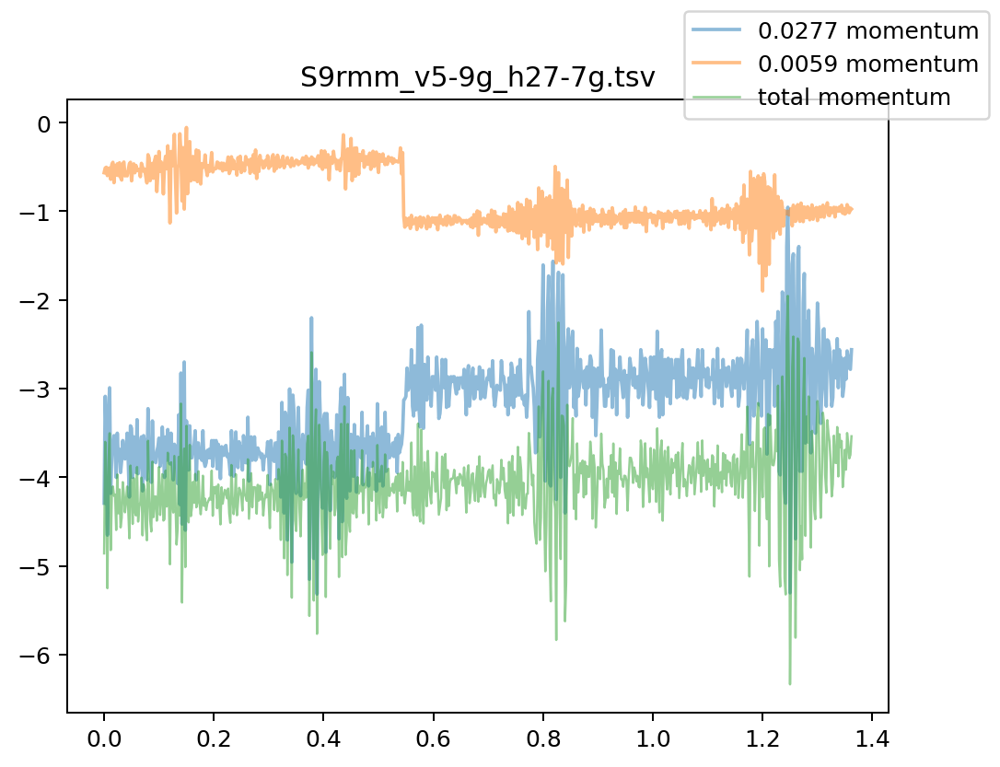

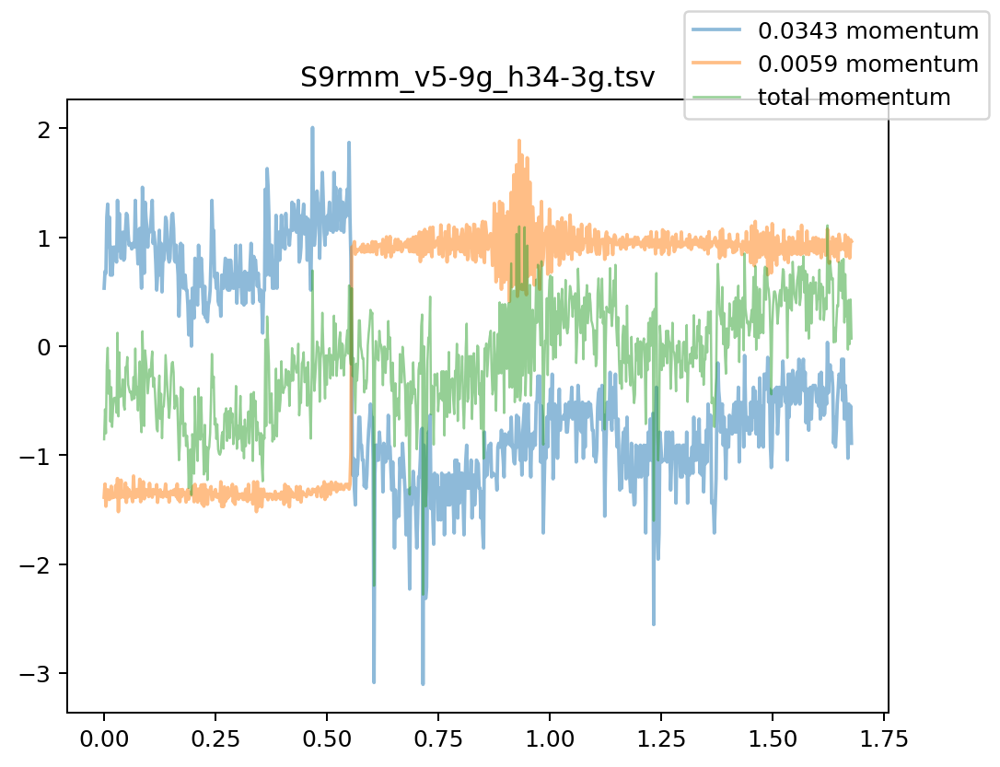

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from parse_script import parse_marker_data
dir = 'data'

# Generate animations for all tsv files in data folder
for root, dirs, files in os.walk(dir):
    for file in files:
        if file.endswith('.tsv') and file.find('mag') == -1: # Ignore magnitudes data
            print("Generating plot from tsv file: ", file)
            markers_dict, ts, masses = parse_marker_data(root + '/' + file)
            fig = plt.figure(dpi=180)
            ax = fig.subplots()
            ax.set_title(file)
            rmm = False if file.find('1D') != -1 or (file.find('rm') != -1 and file.find('rmm') == -1) or file.find('vel') != -1 else True

            frequency = 500
            ts0 = np.array(ts[:-1]) - ts[0]
            estot = np.zeros(len(ts0))
            for name, mass in masses.items():
                xs, ys, zs = markers_dict[f"{name}cm"].T
                dxs = np.array(xs[1:])-np.array(xs[:-1])
                dys = np.array(ys[1:])-np.array(ys[:-1])
                vs = np.sqrt(dxs**2 + dys**2)*frequency
                es = 0.5*mass*vs**2
                estot += es
                
                ax.plot(ts0, es, alpha=0.5, label=f'{mass} energy')
            ax.plot(ts0, estot, alpha=0.5, label=f'total energy', linewidth=1.0)
            fig.legend()
            fig.savefig(f"energy/{file}.png")